# EDA for TSE 1st section dataset

In [1]:
# external modules
import sys
import random
import numpy as np
import pandas as pd
import collections
import matplotlib.pyplot as plt
import japanize_matplotlib
from matplotlib.dates import DateFormatter
import seaborn as sns
import plotly.graph_objects as go
import statsmodels.api as sm

# Pandas setting
# Display 6 columns for viewing purposes
pd.set_option('display.max_columns', 50)

# Reduce decimal points to 2
pd.options.display.float_format = '{:,.2f}'.format

In [2]:
df = pd.read_csv("./../data/processed/tse1_unitchanged.csv", index_col=[0, 1, 2])
df

決算期  連結基準フラグ  決算種別フラグ       決算発表日  \
企業名         決算期（年） 決算期（月）                                          
あい　ホールディングス 2007   6       2007/06        1       10  2007-08-24   
                   9       2007/09        1       21  2007-11-15   
                   12      2007/12        1       22  2008-02-27   
            2008   3       2008/03        1       23  2008-05-23   
                   6       2008/06        1       10  2008-08-22   
...                            ...      ...      ...         ...   
ｇｕｍｉ        2020   1       2020/01        1       23  2020-03-06   
                   4       2020/04        1       10  2020-06-09   
                   7       2020/07        1       21  2020-09-10   
                   10      2020/10        1       22  2020-12-10   
            2021   1       2021/01        1       23  2021-03-12   

                          事業年度開始年月日［３ヵ月］   事業年度終了年月日  １株当たり利益［３ヵ月］  \
企業名         決算期（年） 決算期（月）                                            
あい　ホールディングス 2007   6                 NaN  2007-06-30           nan   
                   9          2007-07-01  2007-09-30          7.16   
                   12                NaN  2007-12-31           nan   
            2008   3                 NaN  2008-03-31           nan   
                   6                 NaN  2008-06-30           nan   
...                                  ...         ...           ...   
ｇｕｍｉ        2020   1          2019-11-01  2020-01-31         15.34   
                   4          2020-02-01  2020-04-30         44.05   
                   7          2020-05-01  2020-07-31         29.87   
                   10         2020-08-01  2020-10-31          3.42   
            2021   1          2020-11-01  2021-01-31         19.63   

                           １株当たり利益［累計］    当期純利益（連結）［累計］        【ＱＴＲ】当期利益  \
企業名         決算期（年） 決算期（月）                                                  
あい　ホールディングス 2007   6             18.13              nan              nan   
                   9              7.16              nan   393,000,000.00   
                   12             2.05              nan  -281,000,000.00   
            2008   3              7.48              nan   299,000,000.00   
                   6             11.10              nan   198,000,000.00   
...                                ...              ...              ...   
ｇｕｍｉ        2020   1             14.24   229,000,000.00   462,000,000.00   
                   4             58.32 1,472,000,000.00 1,328,000,000.00   
                   7             29.87   893,000,000.00   901,000,000.00   
                   10            33.27   988,000,000.00   103,000,000.00   
            2021   1             52.90 1,570,000,000.00   594,000,000.00   

                                      棚卸資産  受取手形・売掛金／売掛金及びその他の短期債権  \
企業名         決算期（年） 決算期（月）                                            
あい　ホールディングス 2007   6      2,785,000,000.00       10,608,000,000.00   
                   9      2,983,000,000.00       10,731,000,000.00   
                   12     3,132,000,000.00        8,980,000,000.00   
            2008   3      3,015,000,000.00        7,775,000,000.00   
                   6      3,072,000,000.00        6,872,000,000.00   
...                                    ...                     ...   
ｇｕｍｉ        2020   1                   nan        3,050,000,000.00   
                   4                   nan        2,968,000,000.00   
                   7                   nan        2,348,000,000.00   
                   10                  nan        2,245,000,000.00   
            2021   1                   nan        2,438,000,000.00   

                                     資本的支出        売上総利益［累計］       【ＱＴＲ】売上総利益  \
企業名         決算期（年） 決算期（月）                                                      
あい　ホールディングス 2007   6         78,000,000.00 2,058,000,000.00              nan   
                   9         44,000,000.00 2,554,000,000.00 2,554,000,000.00   
               

In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
MultiIndex: 143657 entries, ('あい\u3000ホールディングス', 2007, 6) to ('ｇｕｍｉ', 2021, 1)
Data columns (total 33 columns):
 #   Column                     Non-Null Count   Dtype  
---  ------                     --------------   -----  
 0   決算期                        143657 non-null  object 
 1   連結基準フラグ                    143657 non-null  int64  
 2   決算種別フラグ                    143657 non-null  int64  
 3   決算発表日                      139242 non-null  object 
 4   事業年度開始年月日［３ヵ月］             104537 non-null  object 
 5   事業年度終了年月日                  143427 non-null  object 
 6   １株当たり利益［３ヵ月］               100680 non-null  float64
 7   １株当たり利益［累計］                139112 non-null  float64
 8   当期純利益（連結）［累計］              76554 non-null   float64
 9   【ＱＴＲ】当期利益                  123639 non-null  float64
 10  棚卸資産                       134394 non-null  float64
 11  受取手形・売掛金／売掛金及びその他の短期債権     139797 non-null  float64
 12  資本的支出                      102064 non-null  flo

## Check data range (panel data shape)
まずはデータの構造をチェック (行はあっても欠損となっているかもしれないことに留意)

* 企業インデックス

In [4]:
# firm index
df.index.get_level_values(level="企業名").unique()

Index(['あい　ホールディングス', 'あさひ', 'あみやき亭', 'あらた', 'いすゞ自動車', 'いちご', 'いちごオフィスリート投資法人',
       'いちごグリーンインフラ投資法人', 'いちごホテルリート投資法人', 'いであ',
       ...
       'ＶＴホールディングス', 'ＷＤＢホールディングス', 'ＷＯＷ　ＷＯＲＬＤ', 'ＷＯＷＯＷ', 'Ｚホールディングス', 'ＺＯＺＯ',
       'ａｎｄ　ｆａｃｔｏｒｙ', 'ｅＢＡＳＥ', 'ｅｎｉｓｈ', 'ｇｕｍｉ'],
      dtype='object', name='企業名', length=2118)

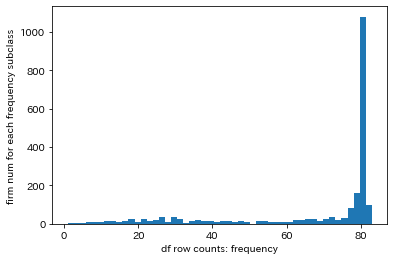

In [5]:
plt.hist(
    collections.Counter(df.index.get_level_values(level=0)).values(),
    bins=50
)
plt.xlabel("df row counts: frequency")
plt.ylabel("firm num for each frequency subclass")
plt.show()

80期(20年)上場し続けている企業は1000社以上ある (上場開始のタイミングは異なるかもしれない)

In [6]:
collections.Counter(df.index.get_level_values(level=0)).values()

dict_values([56, 73, 78, 74, 80, 77, 30, 9, 11, 79, 80, 80, 63, 80, 81, 73, 69, 78, 37, 34, 80, 82, 80, 80, 77, 78, 49, 23, 82, 80, 80, 78, 80, 79, 80, 80, 44, 80, 80, 80, 64, 26, 80, 80, 28, 69, 80, 25, 62, 76, 80, 25, 79, 80, 51, 18, 72, 26, 80, 80, 78, 18, 24, 79, 79, 82, 48, 45, 80, 64, 44, 82, 79, 80, 63, 80, 80, 22, 78, 80, 24, 31, 66, 65, 80, 22, 80, 64, 82, 80, 64, 37, 80, 80, 80, 81, 78, 68, 82, 79, 17, 61, 77, 80, 75, 81, 71, 80, 81, 80, 68, 18, 82, 78, 80, 62, 72, 65, 80, 80, 80, 78, 79, 77, 16, 78, 78, 80, 80, 80, 80, 79, 80, 80, 80, 80, 32, 24, 80, 70, 30, 80, 72, 79, 80, 66, 80, 13, 36, 36, 80, 23, 47, 46, 30, 52, 37, 24, 9, 32, 81, 72, 18, 54, 50, 80, 44, 80, 24, 80, 80, 79, 80, 43, 22, 81, 80, 80, 80, 79, 53, 35, 82, 7, 81, 80, 41, 80, 68, 80, 80, 80, 59, 80, 81, 74, 41, 80, 5, 80, 76, 72, 80, 80, 80, 72, 79, 45, 72, 79, 31, 19, 65, 79, 37, 80, 38, 80, 79, 64, 80, 80, 78, 78, 41, 41, 80, 79, 80, 80, 80, 80, 72, 30, 79, 25, 80, 80, 38, 80, 38, 79, 80, 80, 37, 80, 23, 70,

名前が下にある企業ほどレコード期間が短い(最近上場したやつ?)

* 決算期（年） インデックス

In [7]:
# year index
df.index.get_level_values(level="決算期（年）").unique()

Int64Index([2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017,
            2018, 2019, 2020, 2021, 2000, 2001, 2002, 2003, 2004, 2005, 2006,
            1999],
           dtype='int64', name='決算期（年）')

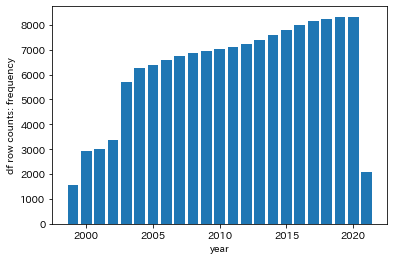

In [8]:
plt.bar(
    collections.Counter(df.index.get_level_values(level=1)).keys(), 
    collections.Counter(df.index.get_level_values(level=1)).values()
)
plt.xlabel("year")
plt.ylabel("df row counts: frequency")
plt.show()

2002年から四半期レコード開始、2003年から本格的にレコードが増える (Q4は次の年としてヒストグラムが描かれている)

* 決算期（月） インデックス

In [9]:
# month index
df.index.get_level_values(level="決算期（月）").unique()

Int64Index([6, 9, 12, 3, 2, 8, 11, 5, 4, 10, 1, 7], dtype='int64', name='決算期（月）')

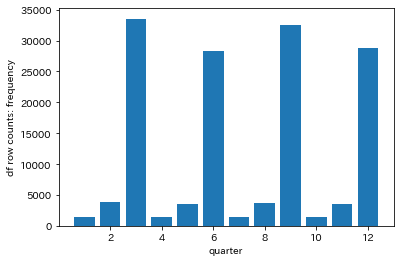

In [10]:
plt.bar(
    collections.Counter(df.index.get_level_values(level=2)).keys(), 
    collections.Counter(df.index.get_level_values(level=2)).values()
)
plt.xlabel("quarter")
plt.ylabel("df row counts: frequency")
plt.show()

3月決算 {Q1: 6, Q2: 9, Q3: 12, Q4: 3} が一番多い。途中から3月決算に変更している企業もあるかもしれない。  
会計期間開始月が違うのがある。3月決算に企業に絞るか? うまくやったら絞る必要はないか?

* 四半期レコードがある企業

In [11]:
years = [y for y in df.index.get_level_values("決算期（年）").unique()]
count010203 = list(map(lambda x: collections.Counter(df.loc[pd.IndexSlice[:, [x], :], :].index.get_level_values("企業名")), years))

In [12]:
count010203 = pd.DataFrame(
    count010203,
    index= list(map(lambda x: "count"+str(x), years))
).T

count010203

,count2007,count2008,count2009,count2010,count2011,count2012,count2013,count2014,count2015,count2016,count2017,count2018,count2019,count2020,count2021,count2000,count2001,count2002,count2003,count2004,count2005,count2006,count1999
あい ホールディングス,3.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,1.00,nan,nan,nan,nan,nan,nan,nan,nan
あさひ,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,1.00,1.00,1.00,1.00,2.00,3.00,4.00,4.00,nan
あみやき亭,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,1.00,1.00,2.00,2.00,4.00,4.00,4.00,4.00,nan
あらた,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,1.00,nan,nan,1.00,4.00,4.00,4.00,4.00,nan
いすゞ自動車,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,4.00,1.00,2.00,2.00,2.00,4.00,4.00,4.00,4.00,1.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
雪国まいたけ,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,4.00,4.00,1.00,nan,nan,nan,nan,nan,nan,nan,nan
ＳＯＳｉＬＡ物流リート投資法人,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,1.00,2.00,nan,nan,nan,nan,nan,nan,nan,nan,nan
ジャパン・インフラファンド投資,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,2.00,nan,nan,nan,nan,nan,nan,nan,nan,nan
ＡＤワークスグループ,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,3.00,1.00,nan,nan,nan,nan,nan,nan,nan,nan


In [13]:
(count010203 == 4).sum()

count2007    1636
count2008    1668
count2009    1698
count2010    1713
count2011    1741
count2012    1766
count2013    1795
count2014    1848
count2015    1903
count2016    1951
count2017    1993
count2018    2018
count2019    2037
count2020    2046
count2021       0
count2000       0
count2001       0
count2002      93
count2003    1196
count2004    1475
count2005    1530
count2006    1584
count1999       0
dtype: int64

In [14]:
count010203[(count010203["count2002"] == 4) & (count010203["count2003"] == 4)].shape

(93, 23)

2001年には四半期レコードはない。2002年には93社が四半期レコード(注: 2001Q1の "2002/03" ~ 2002Q3の "2002/12")を開始。2003年には93社に加えて1198-93社が四半期レコードを開始。  

## Check Missing Value
どのくらい欠損しているかを把握してから記述統計を出す

In [15]:
# Missing value proportion
df.isna().mean()

決算期                         0.00
連結基準フラグ                     0.00
決算種別フラグ                     0.00
決算発表日                       0.03
事業年度開始年月日［３ヵ月］              0.27
事業年度終了年月日                   0.00
１株当たり利益［３ヵ月］                0.30
１株当たり利益［累計］                 0.03
当期純利益（連結）［累計］               0.47
【ＱＴＲ】当期利益                   0.14
棚卸資産                        0.06
受取手形・売掛金／売掛金及びその他の短期債権      0.03
資本的支出                       0.29
売上総利益［累計］                   0.03
【ＱＴＲ】売上総利益                  0.15
販売費及び一般管理費［累計］              0.02
法人税等［累計］                    0.02
法人税・住民税及び事業税合計／当期税金費用［累計］   0.20
税金等調整前当期純利益［累計］             0.11
税金等調整前当期利益［累計］              0.04
【ＱＴＲ】税金等調整前当期利益             0.17
１株当たり税引前利益                  0.11
売上高・営業収益［累計］                0.01
【ＱＴＲ】売上高・営業収益               0.12
１株当たり売上高                    0.11
期末従業員数                      0.49
純資産合計／資本合計                  0.22
【ＱＴＲ】純資産                    0.24
１株当たり純資産                    0.29
期中平均株式数［累計］                 0.12
期中平均株式数［３ヵ

仮に欠損があっても、類似したカラムや1株当たりの逆算で補える場合は補う。  
資本的支出、期末従業員数は比較的欠損が多いけど補填するカラムがないので、補填の方法を考える(過去のレコードの欠損ならperiodを切るのもアリ)  
１株当たり「累計」データは、累計月の期中平均株式数で割っているので「3ヶ月」変換する際は注意  --> 期末発行済み株式数も必要?

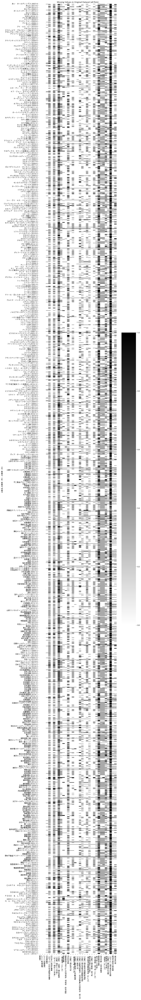

In [16]:
# Visualize Missing Value
fig, ax = plt.subplots(figsize=(10, 100))
ax = sns.heatmap(df.isna(), cmap="binary", linewidths=0, linecolor="gray")
ax.set_title("Missing Values in Original Dataset (all firm)")
plt.show()

全体的に2003年からデータが増えている(四半期レコード開始)  
資本的支出と期末従業員数が2011年くらいから急に欠損が増えている。(年に一回はレコードされているっぽい)

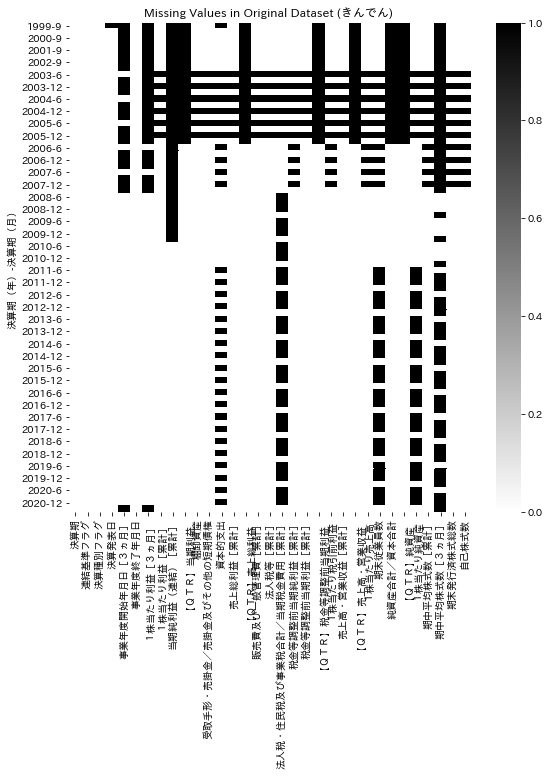

In [17]:
# Check Missing Value for a firm
f = df.index.get_level_values("企業名").unique()[13]
fig, ax = plt.subplots(figsize=(9, 9))
ax = sns.heatmap(df.loc[f].isna(), cmap="binary", linewidths=0, linecolor="gray")
ax.set_title("Missing Values in Original Dataset" + " (" + f + ") ")
plt.show()

(88, 2118)


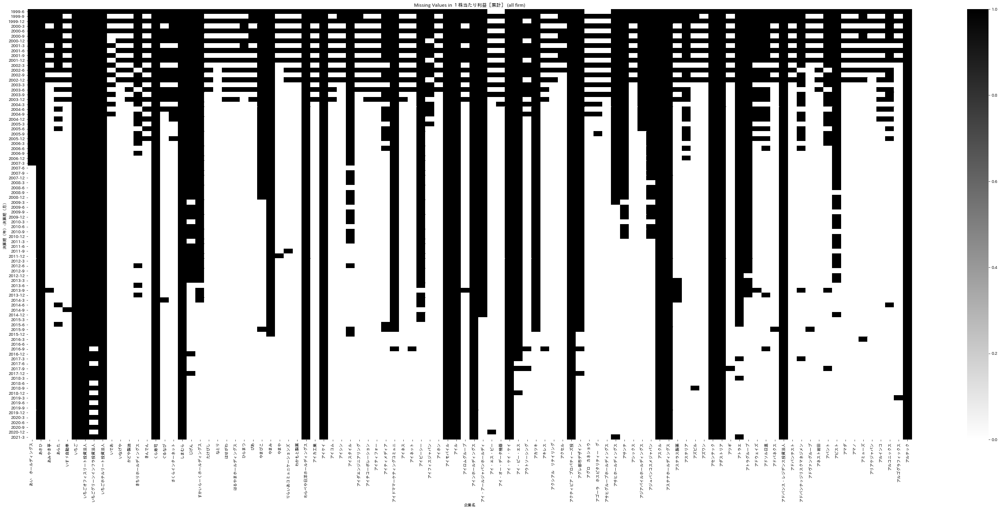

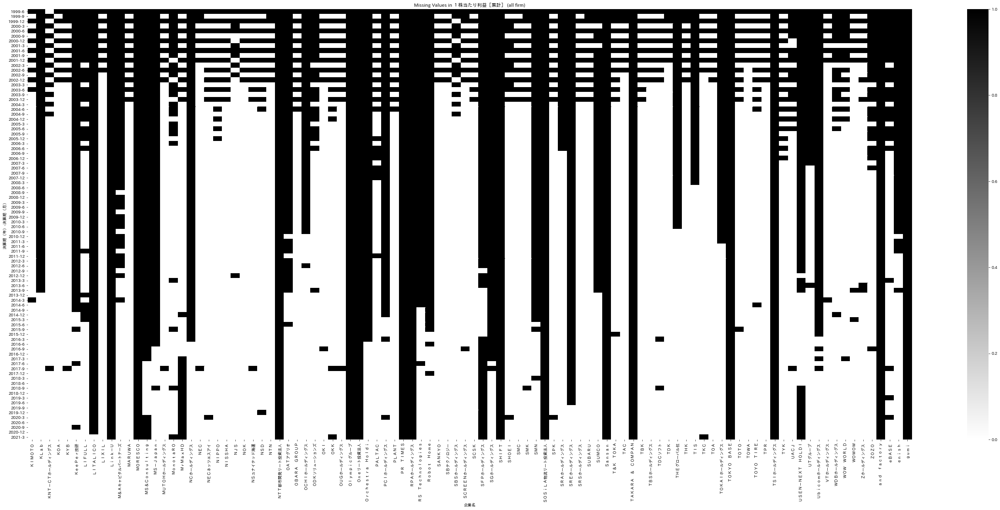

In [18]:
# check eps missing value across firms

# unstack "企業名" index and extract only {Mar, Jun, Sep, Dec}
# とりあえず3, 6, 9, 12ではない企業は排除?
eps = df["１株当たり利益［累計］"].unstack(level=0).loc[pd.IndexSlice[:, [3, 6, 9, 12], :], :]
print(eps.shape)

fig, ax = plt.subplots(figsize=(50, 20))
ax = sns.heatmap(eps.iloc[:, :100].isna(), cmap="binary", linewidths=0, linecolor="gray")
ax.set_title("Missing Values in １株当たり利益［累計］ (all firm)")
plt.show()

fig, ax = plt.subplots(figsize=(50, 20))
ax = sns.heatmap(eps.iloc[:, -100:].isna(), cmap="binary", linewidths=0, linecolor="gray")
ax.set_title("Missing Values in １株当たり利益［累計］ (all firm)")
plt.show()

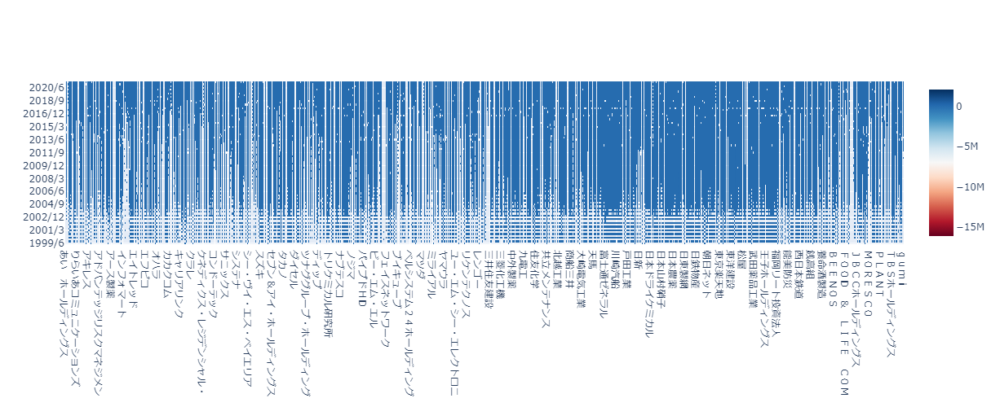

In [19]:
plot_data = eps

fig = go.Figure()

fig.add_trace(go.Heatmap(
    x=plot_data.columns.values,
    y=pd.Series(plot_data.index.values).apply(lambda x: str(x[0]) + "/" + str(x[1])).values,
    z=plot_data.values,
    colorscale='RdBu',
))

fig.update_layout(
    width=1500,
    height=500
)

fig.show()

## 分析対象企業抽出
2003Q1 (FQ［QTR］データ) ~  
または
2008Q1 (企業会計基準第12号｢四半期財務諸表に関する会計基準」および企業会計基準適用指針第14号｢四半期財務諸表に関する会計基準の適用指針｣) ~    
から現在(2020Q4 = 2021/03)まで上場している、3月決算の企業を分析対象とする。

分析対象企業として，東京証券取引所第1部上場企業（金融業を除
く）の中から， 3月決算の企業であり，かつ以下で示すデータがすべて人手可能な企業が選択
された．すなわち，株主資本コスト，加重平均資本コスト，フリーキャッシュフロー， ROE,
会計発生高(accruals),巽常発生高(abnormal accruals)の計算が可能な企業である．分析
対象企業数は， 1983年から2002年まで延べ13,123社である．最初の1983年は409社であり，最
後の2002年は1,026社に増加している．(須田／竹原, 2005)

(1) 3月末決算企業であり，かつ決算H時点においてわが国証券市場に上場，あるいは店頭登録していたこと．<br>
(2)経営者の公表する翌期の予想利益が利用可能であり，かつ予想期間が12ヶ月であること．<br>
(3)t 期末の純資産簿価がプラスであること．<br>
(4)経営者予想利益に基づく予想ROEが土100% 以内であること．<br>
(5)V IPが，0よりも大きいこと．<br>
(6)少なくとも1ヶ月以上のリターンの計測が可能であること．<br>
連結決算情報を公表している企業については，連結決算情報を優先的に採用し，個別決算情報のみを公表している企業は，個別決算情報を採用している．(村宮, 2008)<br>

2003Q1~2020Q4 sample (18会計年度, 72四半期)

In [20]:
# fiscal period: Mar in every year
# firm recorded in 2003Q1
firmlist2003Q1 = set(df.loc[pd.IndexSlice[:, 2003, 6], :].index.get_level_values("企業名").unique())
len(firmlist2003Q1)

1269

In [21]:
# firm recorded in 2020Q4
firmlist2020Q4 = set(df.loc[pd.IndexSlice[:, 2020, 6], :].index.get_level_values("企業名").unique())
len(firmlist2020Q4)

1749

In [22]:
# AND (list not available, use set)
len(firmlist2003Q1 & firmlist2020Q4)

1256

In [23]:
year_range = np.arange(2003, 2021)
month_range = [6, 9, 12, 3]

In [24]:
# check if firm recorded in all quater

# start from firm recorded in 2003Q1
recorded_firm_from_2003 = set(df.loc[pd.IndexSlice[:, 2003, 6], :].index.get_level_values("企業名").unique())

for i in year_range:
    for j in month_range:
        if j == 3: # if Mar, +1 year
            i += 1
        recorded_firm_from_2003 = recorded_firm_from_2003 & set(df.loc[pd.IndexSlice[:, i, j], :].index.get_level_values("企業名").unique())

In [25]:
len(recorded_firm_from_2003)

1160

最初(2003Q1)と最後(2020Q4)だけ見て企業が入っているかどうか判断すると、半期決算だけしている企業や、途中で記録が抜けている企業を取り除けない。   
--> 全四半期ループでANDして入っているか確認

In [26]:
df_2003 = df.loc[pd.IndexSlice[recorded_firm_from_2003, 2003:, 3:], :] # 月を3: としているのは、2003/01を排除するため。

In [27]:
df_2003 = df_2003[df_2003["決算期"] != "2003/03"] # 2003/03は2002年度決算なので排除

In [28]:
df_2003.index.get_level_values(2).unique()

Int64Index([6, 9, 12, 3], dtype='int64', name='決算期（月）')

In [29]:
print("num firm: ", df_2003.index.get_level_values(0).unique().shape[0])
print("num year: ", df_2003.index.get_level_values(1).unique().shape[0] - 1)
print("num month: ", df_2003.index.get_level_values(2).unique().shape[0])

num firm:  1160
num year:  18
num month:  4


In [30]:
# 企業数(1160) * 年数(19) * 月数(4) == df_2003全体の行数になるはず
df_2003.index.get_level_values(0).unique().shape[0] * (df_2003.index.get_level_values(1).unique().shape[0] - 1) * df_2003.index.get_level_values(2).unique().shape[0]

83520

In [31]:
# 等しい
df_2003.shape[0]

83520

これでbalanced panel dataが完成

In [32]:
# 各年ごとの行数確認
for i in range(2003, 2021+1):
    print("year: ", i)
    print("    num row: ", df_2003.loc[pd.IndexSlice[:, i, :], :].shape[0])

year:  2003
    num row:  3480
year:  2004
    num row:  4640
year:  2005
    num row:  4640
year:  2006
    num row:  4640
year:  2007
    num row:  4640
year:  2008
    num row:  4640
year:  2009
    num row:  4640
year:  2010
    num row:  4640
year:  2011
    num row:  4640
year:  2012
    num row:  4640
year:  2013
    num row:  4640
year:  2014
    num row:  4640
year:  2015
    num row:  4640
year:  2016
    num row:  4640
year:  2017
    num row:  4640
year:  2018
    num row:  4640
year:  2019
    num row:  4640
year:  2020
    num row:  4640
year:  2021
    num row:  1160


同様に、  
2008Q1~2020Q4 sample (13会計年度, 52四半期)

In [33]:
year_range = np.arange(2008, 2021)
month_range = [6, 9, 12, 3]

# check if firm recorded in all quater
# start from firm recorded in 2008Q1
recorded_firm_from_2008 = set(df.loc[pd.IndexSlice[:, 2008, 6], :].index.get_level_values("企業名").unique())

for i in year_range:
    for j in month_range:
        if j == 3: # if Mar, +1 year
            i += 1
        recorded_firm_from_2008 = recorded_firm_from_2008 & set(df.loc[pd.IndexSlice[:, i, j], :].index.get_level_values("企業名").unique())

In [34]:
len(recorded_firm_from_2008)

1436

In [35]:
df_2008 = df.loc[pd.IndexSlice[recorded_firm_from_2008, 2008:, 3:], :] # 月を3: としているのは、2003/01を排除するため。

In [36]:
df_2008 = df_2008[df_2008["決算期"] != "2008/03"] # 2008/03は2007年度決算なので排除

In [37]:
df_2008.index.get_level_values(2).unique()

Int64Index([6, 9, 12, 3], dtype='int64', name='決算期（月）')

In [38]:
print("num firm: ", df_2008.index.get_level_values(0).unique().shape[0])
print("num year: ", df_2008.index.get_level_values(1).unique().shape[0] - 1)
print("num month: ", df_2008.index.get_level_values(2).unique().shape[0])

num firm:  1436
num year:  13
num month:  4


In [39]:
df_2008.index.get_level_values(0).unique().shape[0] * (df_2008.index.get_level_values(1).unique().shape[0] - 1) * df_2008.index.get_level_values(2).unique().shape[0]

74672

In [40]:
# 等しい
df_2008.shape[0]

74672

これでbalanced panel dataが完成

In [41]:
# 各年ごとの行数確認
for i in range(2008, 2021+1):
    print("year: ", i)
    print("    num row: ", df_2008.loc[pd.IndexSlice[:, i, :], :].shape[0])

year:  2008
    num row:  4308
year:  2009
    num row:  5744
year:  2010
    num row:  5744
year:  2011
    num row:  5744
year:  2012
    num row:  5744
year:  2013
    num row:  5744
year:  2014
    num row:  5744
year:  2015
    num row:  5744
year:  2016
    num row:  5744
year:  2017
    num row:  5744
year:  2018
    num row:  5744
year:  2019
    num row:  5744
year:  2020
    num row:  5744
year:  2021
    num row:  1436


In [42]:
# save subsample tse1 dataset as csv
df_2003.to_csv("../data/processed/tse1_2003_balanced.csv")
df_2008.to_csv("../data/processed/tse1_2008_balanced.csv")

In [43]:
df_2003 = pd.read_csv("../data/processed/tse1_2003_balanced.csv", index_col=[0, 1, 2])
df_2008 = pd.read_csv("../data/processed/tse1_2008_balanced.csv", index_col=[0, 1, 2])

In [44]:
df_2003.describe()

,連結基準フラグ,決算種別フラグ,１株当たり利益［３ヵ月］,１株当たり利益［累計］,当期純利益（連結）［累計］,【ＱＴＲ】当期利益,棚卸資産,受取手形・売掛金／売掛金及びその他の短期債権,資本的支出,売上総利益［累計］,【ＱＴＲ】売上総利益,販売費及び一般管理費［累計］,法人税等［累計］,法人税・住民税及び事業税合計／当期税金費用［累計］,税金等調整前当期純利益［累計］,税金等調整前当期利益［累計］,【ＱＴＲ】税金等調整前当期利益,１株当たり税引前利益,売上高・営業収益［累計］,【ＱＴＲ】売上高・営業収益,１株当たり売上高,期末従業員数,純資産合計／資本合計,【ＱＴＲ】純資産,１株当たり純資産,期中平均株式数［累計］,期中平均株式数［３ヵ月］,期末発行済株式総数,自己株式数
count,"83,520.00","83,520.00","64,122.00","81,126.00","48,947.00","80,108.00","80,125.00","81,101.00","59,571.00","81,503.00","79,441.00","80,947.00","81,631.00","65,281.00","71,943.00","78,992.00","77,107.00","72,491.00","82,893.00","82,128.00","72,331.00","39,328.00","68,886.00","68,711.00","59,238.00","72,226.00","24,252.00","72,402.00","70,404.00"
mean,1.04,19.00,68.12,214.84,"12,144,784,297.30","3,584,167,998.20","47,853,629,316.69","71,960,848,065.99","19,654,050,662.23","57,281,073,089.33","23,287,989,765.99","42,656,421,127.40","5,270,213,962.83","4,878,705,871.54","15,440,195,654.89","12,046,954,818.21","4,720,284,980.61","12,615.84","248,567,120,890.79","101,449,650,752.48","127,233.37","9,921.58","200,406,219,115.64","199,944,938,437.80","4,632.78","177,489,133.06","222,903,619.45","183,411,668.69","5,046,703.95"
std,0.45,5.24,804.26,"2,168.66","71,549,208,906.36","25,684,298,474.70","141,967,789,108.33","231,604,062,521.76","113,506,776,007.37","222,571,839,129.74","81,176,226,894.44","162,046,363,376.54","25,083,116,449.82","22,877,465,332.40","79,655,635,646.92","61,843,286,994.92","24,907,990,113.80","3,239,968.67","928,453,926,547.78","340,575,140,318.27","31,870,339.01","30,597.09","699,943,921,048.25","699,390,993,523.16","29,507.78","447,592,470.79","529,827,258.35","465,921,248.58","23,168,730.46"
min,0.00,10.00,"-17,507.77","-51,600.85","-1,244,579,000,000.00","-1,438,163,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","-314,012,000,000.00","-409,736,000,000.00","34,000,000.00","-853,182,000,000.00","-91,020,000,000.00","-812,844,000,000.00","-812,844,000,000.00","-984,026,000,000.00","-154,077.31","20,000,000.00","-1,074,904,000,000.00",1.37,9.00,"-416,811,000,000.00","-416,811,000,000.00","-1,440.26",4.00,"8,400.00","4,477.00",1.00
25%,1.00,10.00,3.01,7.22,"397,000,000.00","122,000,000.00","3,131,000,000.00","6,407,000,000.00","475,000,000.00","3,965,000,000.00","1,954,000,000.00","3,019,000,000.00","222,000,000.00","202,000,000.00","532,000,000.00","494,000,000.00","224,000,000.00",27.23,"17,523,000,000.00","8,536,000,000.00",941.93,813.00,"19,330,250,000.00","19,340,500,000.00",459.56,"20,883,186.75","22,425,669.00","22,272,000.00","166,865.50"
50%,1.00,21.00,14.04,28.56,"1,640,000,000.00","580,000,000.00","9,482,000,000.00","18,136,000,000.00","1,799,000,000.00","10,515,000,000.00","4,668,000,000.00","7,861,000,000.00","805,000,000.00","719,000,000.00","2,158,000,000.00","1,969,000,000.00","909,000,000.00",87.16,"47,835,000,000.00","22,149,500,000.00","1,757.54","2,068.00","45,165,500,000.00","45,187,000,000.00",900.40,"47,237,956.50","55,697,257.50","49,757,821.00","997,418.00"
75%,1.00,22.00,35.34,76.11,"6,003,500,000.00","2,100,000,000.00","30,907,000,000.00","48,513,000,000.00","7,522,000,000.00","33,527,000,000.00","14,815,000,000.00","24,819,500,000.00","2,842,500,000.00","2,442,000,000.00","7,860,000,000.00","6,844,250,000.00","3,046,000,000.00",199.59,"149,387,000,000.00","64,045,000,000.00","3,404.59","6,066.00","133,162,500,000.00","132,968,000,000.00","1,660.62","129,223,315.75","167,026,831.00","135,171,942.00","3,596,931.50"
max,3.00,24.00,"70,900.55","109,082.99","5,078,236,000,000.00","1,932,800,000,000.00","2,888,028,000,000.00","9,714,931,000,000.00","5,121,960,000,000.00","6,949,478,000,000.00","2,004,790,000,000.00","5,393,229,000,000.00","1,303,168,000,000.00","926,089,000,000.00","5,670,456,000,000.00","2,983,381,000,000.00","863,087,000,000.00","872,333,333.33","30,225,681,000,000.00","8,150,032,000,000.00","8,571,333,333.33","385,243.00","24,288,329,000,000.00","24,288,329,000,000.00","919,780.33","9,128,219,199.00","9,128,219,199.00"

In [45]:
df_2003.isna().mean()

決算期                         0.00
連結基準フラグ                     0.00
決算種別フラグ                     0.00
決算発表日                       0.00
事業年度開始年月日［３ヵ月］              0.20
事業年度終了年月日                   0.00
１株当たり利益［３ヵ月］                0.23
１株当たり利益［累計］                 0.03
当期純利益（連結）［累計］               0.41
【ＱＴＲ】当期利益                   0.04
棚卸資産                        0.04
受取手形・売掛金／売掛金及びその他の短期債権      0.03
資本的支出                       0.29
売上総利益［累計］                   0.02
【ＱＴＲ】売上総利益                  0.05
販売費及び一般管理費［累計］              0.03
法人税等［累計］                    0.02
法人税・住民税及び事業税合計／当期税金費用［累計］   0.22
税金等調整前当期純利益［累計］             0.14
税金等調整前当期利益［累計］              0.05
【ＱＴＲ】税金等調整前当期利益             0.08
１株当たり税引前利益                  0.13
売上高・営業収益［累計］                0.01
【ＱＴＲ】売上高・営業収益               0.02
１株当たり売上高                    0.13
期末従業員数                      0.53
純資産合計／資本合計                  0.18
【ＱＴＲ】純資産                    0.18
１株当たり純資産                    0.29
期中平均株式数［累計］                 0.14
期中平均株式数［３ヵ

In [46]:
df_2008.describe()

,連結基準フラグ,決算種別フラグ,１株当たり利益［３ヵ月］,１株当たり利益［累計］,当期純利益（連結）［累計］,【ＱＴＲ】当期利益,棚卸資産,受取手形・売掛金／売掛金及びその他の短期債権,資本的支出,売上総利益［累計］,【ＱＴＲ】売上総利益,販売費及び一般管理費［累計］,法人税等［累計］,法人税・住民税及び事業税合計／当期税金費用［累計］,税金等調整前当期純利益［累計］,税金等調整前当期利益［累計］,【ＱＴＲ】税金等調整前当期利益,１株当たり税引前利益,売上高・営業収益［累計］,【ＱＴＲ】売上高・営業収益,１株当たり売上高,期末従業員数,純資産合計／資本合計,【ＱＴＲ】純資産,１株当たり純資産,期中平均株式数［累計］,期中平均株式数［３ヵ月］,期末発行済株式総数,自己株式数
count,"74,672.00","74,672.00","72,366.00","73,759.00","59,570.00","74,397.00","72,486.00","74,205.00","51,955.00","74,473.00","74,204.00","74,070.00","74,516.00","54,923.00","74,646.00","71,434.00","71,294.00","74,216.00","74,504.00","74,237.00","74,056.00","34,556.00","74,214.00","74,019.00","46,784.00","73,781.00","29,203.00","74,515.00","72,185.00"
mean,1.05,19.00,82.55,203.95,"10,788,682,927.65","3,185,831,068.46","45,272,322,420.88","65,591,667,259.62","18,533,372,129.73","52,477,749,734.80","21,171,699,962.27","38,530,101,917.11","4,707,823,111.81","4,310,150,228.50","13,610,877,635.77","10,158,712,405.86","3,911,389,303.45",666.21,"225,307,498,926.23","91,432,999,932.65","10,156.23","9,439.12","187,265,483,709.27","186,821,414,339.56","4,930.07","159,097,952.95","197,792,080.23","164,698,523.72","4,924,021.74"
std,0.49,5.24,949.00,"2,014.95","65,333,269,889.53","25,410,136,305.37","139,189,654,068.47","219,045,048,640.68","108,863,616,446.61","203,691,595,786.69","74,454,166,171.91","142,279,401,540.57","23,929,429,633.93","22,386,774,393.92","73,554,795,397.89","54,689,930,707.90","22,452,072,490.23","6,833.44","842,792,781,068.70","307,427,826,579.30","63,599.90","30,128.37","678,071,904,478.32","677,539,821,931.88","26,863.65","420,103,517.05","494,669,764.09","437,525,207.73","22,162,482.48"
min,0.00,10.00,"-48,623.22","-82,593.01","-1,244,579,000,000.00","-1,438,163,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","-314,012,000,000.00","-409,736,000,000.00","44,000,000.00","-853,182,000,000.00","-91,020,000,000.00","-812,844,000,000.00","-812,844,000,000.00","-984,026,000,000.00","-87,715.73","57,000,000.00","-1,074,904,000,000.00",1.37,13.00,"-416,811,000,000.00","-416,811,000,000.00","-4,053.72","6,540.00","6,540.00","6,705.00",1.00
25%,1.00,10.00,3.29,7.67,"365,000,000.00","101,000,000.00","2,539,000,000.00","4,881,000,000.00","411,000,000.00","3,499,000,000.00","1,712,000,000.00","2,667,000,000.00","191,000,000.00","173,000,000.00","445,000,000.00","421,000,000.00","185,000,000.00",28.85,"14,882,750,000.00","7,380,000,000.00",954.05,730.00,"16,192,500,000.00","16,227,500,000.00",499.76,"18,173,338.00","19,312,893.00","19,180,984.00","159,941.00"
50%,1.00,21.00,15.23,32.00,"1,487,000,000.00","527,000,000.00","8,578,500,000.00","14,850,000,000.00","1,639,000,000.00","9,497,000,000.00","4,194,000,000.00","7,084,000,000.00","699,000,000.00","609,000,000.00","1,876,000,000.00","1,741,000,000.00","793,000,000.00",94.39,"42,161,000,000.00","19,615,000,000.00","1,816.91","1,849.00","40,147,000,000.00","40,163,000,000.00","1,023.34","41,486,152.00","46,179,013.00","43,140,999.00","950,184.00"
75%,1.00,22.00,37.71,85.00,"5,315,000,000.00","1,875,000,000.00","28,355,000,000.00","43,456,000,000.00","6,891,000,000.00","30,589,000,000.00","13,322,500,000.00","22,675,250,000.00","2,464,000,000.00","2,034,000,000.00","6,824,000,000.00","5,968,000,000.00","2,625,000,000.00",216.04,"136,397,500,000.00","59,030,000,000.00","3,643.79","5,690.25","118,395,500,000.00","118,228,000,000.00","1,881.28","115,022,522.00","138,648,765.50","119,401,836.00","3,353,105.00"
max,3.00,24.00,"48,833.15","71,420.18","5,078,236,000,000.00","1,932,800,000,000.00","2,888,028,000,000.00","9,714,931,000,000.00","5,121,960,000,000.00","6,947,032,000,000.00","2,004,790,000,000.00","5,145,883,000,000.00","1,303,168,000,000.00","926,089,000,000.00","5,670,456,000,000.00","2,983,381,000,000.00","846,461,000,000.00","648,310.39","30,225,681,000,000.00","8,150,032,000,000.00","3,030,346.69","385,243.00","24,288,329,000,000.00","24,288,329,000,000.00","720,198.00","9,128,219,199.00","9,128,219,199.00","9,503,214,022

In [47]:
df_2008.isna().mean()

決算期                         0.00
連結基準フラグ                     0.00
決算種別フラグ                     0.00
決算発表日                       0.00
事業年度開始年月日［３ヵ月］              0.02
事業年度終了年月日                   0.00
１株当たり利益［３ヵ月］                0.03
１株当たり利益［累計］                 0.01
当期純利益（連結）［累計］               0.20
【ＱＴＲ】当期利益                   0.00
棚卸資産                        0.03
受取手形・売掛金／売掛金及びその他の短期債権      0.01
資本的支出                       0.30
売上総利益［累計］                   0.00
【ＱＴＲ】売上総利益                  0.01
販売費及び一般管理費［累計］              0.01
法人税等［累計］                    0.00
法人税・住民税及び事業税合計／当期税金費用［累計］   0.26
税金等調整前当期純利益［累計］             0.00
税金等調整前当期利益［累計］              0.04
【ＱＴＲ】税金等調整前当期利益             0.05
１株当たり税引前利益                  0.01
売上高・営業収益［累計］                0.00
【ＱＴＲ】売上高・営業収益               0.01
１株当たり売上高                    0.01
期末従業員数                      0.54
純資産合計／資本合計                  0.01
【ＱＴＲ】純資産                    0.01
１株当たり純資産                    0.37
期中平均株式数［累計］                 0.01
期中平均株式数［３ヵ

df_2003は、

num firm:  1160  
num year:  18  
num month:  4  
quater = 18 * 4 = 72  

df_2008は  

num firm:  1436  
num year:  13  
num month:  4  
quater = 13 * 4 = 52  

df_2003のメリット  
企業数は少ないけど時系列永井からモデルの推定にいいかも。ちなみに企業数1160は5つに割り切れるので、VPRのときにきれいになる

df_2008のメリット  
データの欠損が少ない。特に"１株当たり利益［３ヵ月］"の欠損が3%なのはうれしい

zhang et al.(2004)は283社,40四半期、Cao and Parry (2009) は283社,45四半期くらい、Cao and Gan は723社39四半期  
つまり、df_2008でも時系列の長さ的には足りる。とりあえずdf_2008で行きますか。

## スケーリング前の記述統計・原系列の観察

In [48]:
df_2008.describe()

,連結基準フラグ,決算種別フラグ,１株当たり利益［３ヵ月］,１株当たり利益［累計］,当期純利益（連結）［累計］,【ＱＴＲ】当期利益,棚卸資産,受取手形・売掛金／売掛金及びその他の短期債権,資本的支出,売上総利益［累計］,【ＱＴＲ】売上総利益,販売費及び一般管理費［累計］,法人税等［累計］,法人税・住民税及び事業税合計／当期税金費用［累計］,税金等調整前当期純利益［累計］,税金等調整前当期利益［累計］,【ＱＴＲ】税金等調整前当期利益,１株当たり税引前利益,売上高・営業収益［累計］,【ＱＴＲ】売上高・営業収益,１株当たり売上高,期末従業員数,純資産合計／資本合計,【ＱＴＲ】純資産,１株当たり純資産,期中平均株式数［累計］,期中平均株式数［３ヵ月］,期末発行済株式総数,自己株式数
count,"74,672.00","74,672.00","72,366.00","73,759.00","59,570.00","74,397.00","72,486.00","74,205.00","51,955.00","74,473.00","74,204.00","74,070.00","74,516.00","54,923.00","74,646.00","71,434.00","71,294.00","74,216.00","74,504.00","74,237.00","74,056.00","34,556.00","74,214.00","74,019.00","46,784.00","73,781.00","29,203.00","74,515.00","72,185.00"
mean,1.05,19.00,82.55,203.95,"10,788,682,927.65","3,185,831,068.46","45,272,322,420.88","65,591,667,259.62","18,533,372,129.73","52,477,749,734.80","21,171,699,962.27","38,530,101,917.11","4,707,823,111.81","4,310,150,228.50","13,610,877,635.77","10,158,712,405.86","3,911,389,303.45",666.21,"225,307,498,926.23","91,432,999,932.65","10,156.23","9,439.12","187,265,483,709.27","186,821,414,339.56","4,930.07","159,097,952.95","197,792,080.23","164,698,523.72","4,924,021.74"
std,0.49,5.24,949.00,"2,014.95","65,333,269,889.53","25,410,136,305.37","139,189,654,068.47","219,045,048,640.68","108,863,616,446.61","203,691,595,786.69","74,454,166,171.91","142,279,401,540.57","23,929,429,633.93","22,386,774,393.92","73,554,795,397.89","54,689,930,707.90","22,452,072,490.23","6,833.44","842,792,781,068.70","307,427,826,579.30","63,599.90","30,128.37","678,071,904,478.32","677,539,821,931.88","26,863.65","420,103,517.05","494,669,764.09","437,525,207.73","22,162,482.48"
min,0.00,10.00,"-48,623.22","-82,593.01","-1,244,579,000,000.00","-1,438,163,000,000.00","1,000,000.00","1,000,000.00","1,000,000.00","-314,012,000,000.00","-409,736,000,000.00","44,000,000.00","-853,182,000,000.00","-91,020,000,000.00","-812,844,000,000.00","-812,844,000,000.00","-984,026,000,000.00","-87,715.73","57,000,000.00","-1,074,904,000,000.00",1.37,13.00,"-416,811,000,000.00","-416,811,000,000.00","-4,053.72","6,540.00","6,540.00","6,705.00",1.00
25%,1.00,10.00,3.29,7.67,"365,000,000.00","101,000,000.00","2,539,000,000.00","4,881,000,000.00","411,000,000.00","3,499,000,000.00","1,712,000,000.00","2,667,000,000.00","191,000,000.00","173,000,000.00","445,000,000.00","421,000,000.00","185,000,000.00",28.85,"14,882,750,000.00","7,380,000,000.00",954.05,730.00,"16,192,500,000.00","16,227,500,000.00",499.76,"18,173,338.00","19,312,893.00","19,180,984.00","159,941.00"
50%,1.00,21.00,15.23,32.00,"1,487,000,000.00","527,000,000.00","8,578,500,000.00","14,850,000,000.00","1,639,000,000.00","9,497,000,000.00","4,194,000,000.00","7,084,000,000.00","699,000,000.00","609,000,000.00","1,876,000,000.00","1,741,000,000.00","793,000,000.00",94.39,"42,161,000,000.00","19,615,000,000.00","1,816.91","1,849.00","40,147,000,000.00","40,163,000,000.00","1,023.34","41,486,152.00","46,179,013.00","43,140,999.00","950,184.00"
75%,1.00,22.00,37.71,85.00,"5,315,000,000.00","1,875,000,000.00","28,355,000,000.00","43,456,000,000.00","6,891,000,000.00","30,589,000,000.00","13,322,500,000.00","22,675,250,000.00","2,464,000,000.00","2,034,000,000.00","6,824,000,000.00","5,968,000,000.00","2,625,000,000.00",216.04,"136,397,500,000.00","59,030,000,000.00","3,643.79","5,690.25","118,395,500,000.00","118,228,000,000.00","1,881.28","115,022,522.00","138,648,765.50","119,401,836.00","3,353,105.00"
max,3.00,24.00,"48,833.15","71,420.18","5,078,236,000,000.00","1,932,800,000,000.00","2,888,028,000,000.00","9,714,931,000,000.00","5,121,960,000,000.00","6,947,032,000,000.00","2,004,790,000,000.00","5,145,883,000,000.00","1,303,168,000,000.00","926,089,000,000.00","5,670,456,000,000.00","2,983,381,000,000.00","846,461,000,000.00","648,310.39","30,225,681,000,000.00","8,150,032,000,000.00","3,030,346.69","385,243.00","24,288,329,000,000.00","24,288,329,000,000.00","720,198.00","9,128,219,199.00","9,128,219,199.00","9,503,214,022

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f1e2c452190>,
      dtype=object)

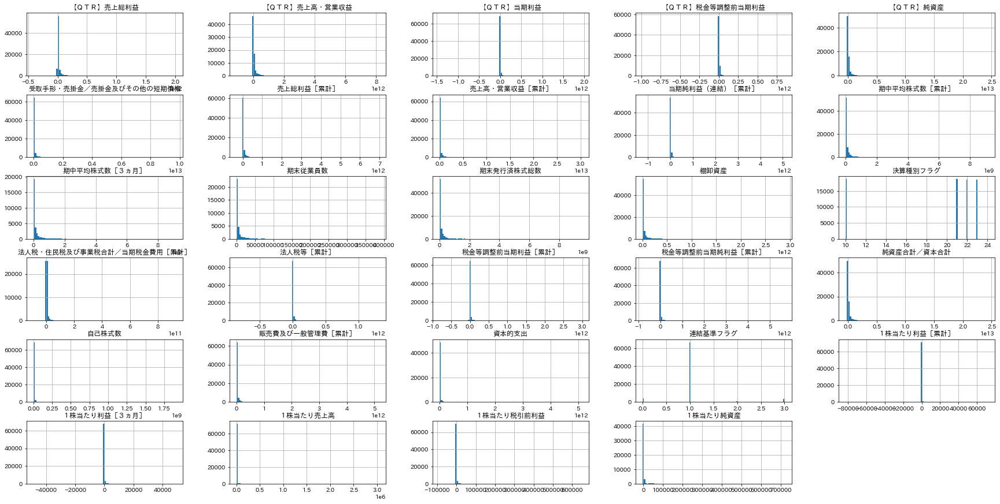

In [49]:
df_2008.hist(figsize=(30, 15), bins=100)

どの変数も、最頻値がとびぬけていて、周りのbinが小さすぎて見えない範囲が広い。  
つまり、レコードは少ないけど外している具合がめちゃくちゃでかい外れ値がどのカラムにも存在する。

* EPS最小値を記録した企業の個別調査

In [50]:
df_2008[df_2008["１株当たり利益［３ヵ月］"] == df_2008["１株当たり利益［３ヵ月］"].min()]

,,,決算期,連結基準フラグ,決算種別フラグ,決算発表日,事業年度開始年月日［３ヵ月］,事業年度終了年月日,１株当たり利益［３ヵ月］,１株当たり利益［累計］,当期純利益（連結）［累計］,【ＱＴＲ】当期利益,棚卸資産,受取手形・売掛金／売掛金及びその他の短期債権,資本的支出,売上総利益［累計］,【ＱＴＲ】売上総利益,販売費及び一般管理費［累計］,法人税等［累計］,法人税・住民税及び事業税合計／当期税金費用［累計］,税金等調整前当期純利益［累計］,税金等調整前当期利益［累計］,【ＱＴＲ】税金等調整前当期利益,１株当たり税引前利益,売上高・営業収益［累計］,【ＱＴＲ】売上高・営業収益,１株当たり売上高,期末従業員数,純資産合計／資本合計,【ＱＴＲ】純資産,１株当たり純資産,期中平均株式数［累計］,期中平均株式数［３ヵ月］,期末発行済株式総数,自己株式数
企業名,決算期（年）,決算期（月）,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
日本商業開発,2008,12,2008/12,1,23,2009-02-10,2008-10-01,2008-12-31,"-48,623.22","-67,589.99",nan,"-540,000,000.00","9,442,000,000.00","8,000,000.00","53,000,000.00","333,000,000.00","-294,000,000.00","631,000,000.00","45,000,000.00","1,000,000.00","-721,000,000.00","-721,000,000.00","-536,000,000.00","-86,567.61","10,805,000,000.00","443,000,000.00","1,297,313.52",19.00,"450,000,000.00","450,000,000.00","36,992.29","11,105.00","11,105.00","11,105.00",nan


In [51]:
min_firm = df_2008[df_2008["１株当たり利益［３ヵ月］"] == df_2008["１株当たり利益［３ヵ月］"].min()].index[0][0]

In [52]:
df_2008.loc[pd.IndexSlice[min_firm, :, :], :]["１株当たり利益［３ヵ月］"]

企業名     決算期（年）  決算期（月）
日本商業開発  2008    6          3,842.06
                9        -22,808.84
                12       -48,623.22
        2009    3        -15,003.02
                6        -11,340.62
                9         -6,932.54
                12        -7,892.54
        2010    3         48,185.70
                6          1,164.27
                9           -617.02
                12           677.33
        2011    3         27,365.40
                6         31,886.48
                9         -1,491.40
                12          -627.11
        2012    3          5,684.56
                6         -6,401.87
                9         -6,406.63
                12        -5,315.79
        2013    3               nan
                6               nan
                9             75.30
                12             2.97
        2014    3             81.40
                6            -36.64
                9             65.98
                12           -15.71
     

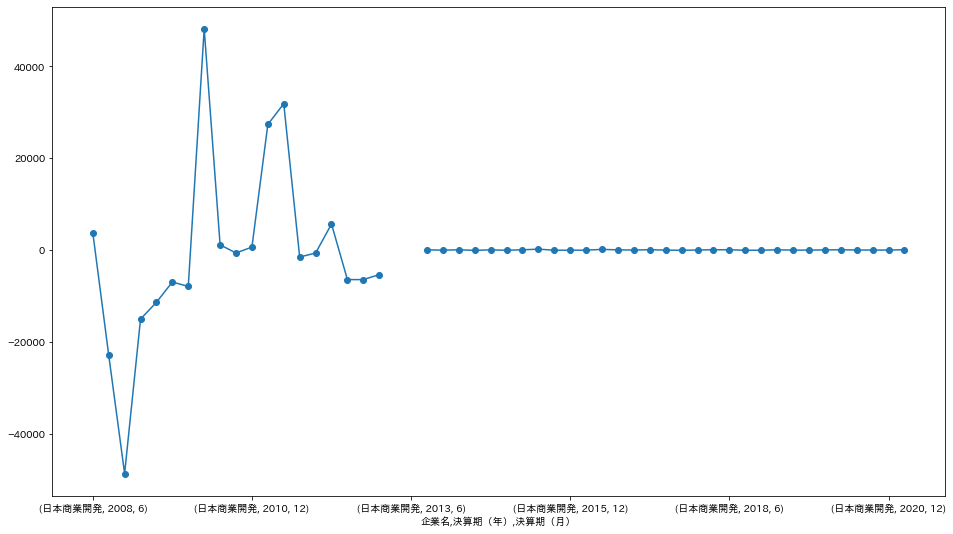

In [53]:
df_2008.loc[pd.IndexSlice[min_firm, :, :], :]["１株当たり利益［３ヵ月］"].plot(figsize=(16, 9), marker='o')

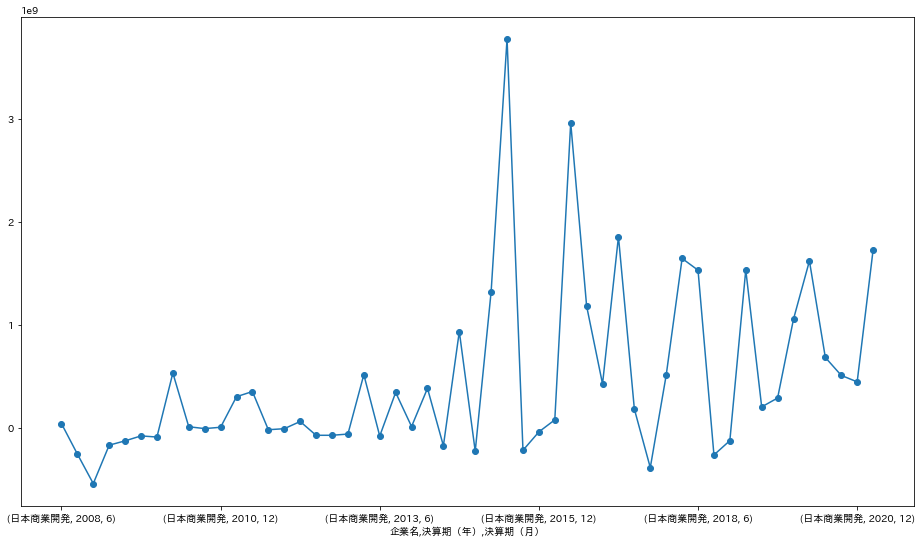

In [54]:
df_2008.loc[pd.IndexSlice[min_firm, :, :], :]['【ＱＴＲ】当期利益'].plot(figsize=(16, 9), marker='o')

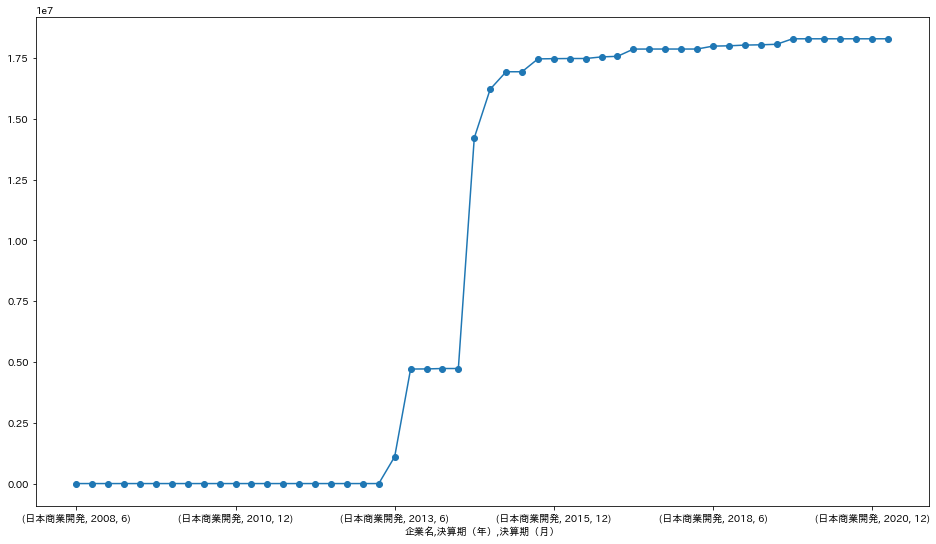

In [55]:
df_2008.loc[pd.IndexSlice[min_firm, :, :], :]['期末発行済株式総数'].plot(figsize=(16, 9), marker='o')

* EPSの最大値を記録した企業の個別調査

In [56]:
df_2008[df_2008["１株当たり利益［３ヵ月］"] == df_2008["１株当たり利益［３ヵ月］"].max()]

,,,決算期,連結基準フラグ,決算種別フラグ,決算発表日,事業年度開始年月日［３ヵ月］,事業年度終了年月日,１株当たり利益［３ヵ月］,１株当たり利益［累計］,当期純利益（連結）［累計］,【ＱＴＲ】当期利益,棚卸資産,受取手形・売掛金／売掛金及びその他の短期債権,資本的支出,売上総利益［累計］,【ＱＴＲ】売上総利益,販売費及び一般管理費［累計］,法人税等［累計］,法人税・住民税及び事業税合計／当期税金費用［累計］,税金等調整前当期純利益［累計］,税金等調整前当期利益［累計］,【ＱＴＲ】税金等調整前当期利益,１株当たり税引前利益,売上高・営業収益［累計］,【ＱＴＲ】売上高・営業収益,１株当たり売上高,期末従業員数,純資産合計／資本合計,【ＱＴＲ】純資産,１株当たり純資産,期中平均株式数［累計］,期中平均株式数［３ヵ月］,期末発行済株式総数,自己株式数
企業名,決算期（年）,決算期（月）,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
デジタルガレージ,2009,6,2009/06,1,10,2009-08-13,2009-04-01,2009-06-30,"48,833.15","30,873.32",nan,"9,013,000,000.00","85,000,000.00","2,850,000,000.00","694,000,000.00","12,441,000,000.00","3,491,000,000.00","11,459,000,000.00","5,507,000,000.00","5,506,000,000.00","12,259,000,000.00","12,259,000,000.00","14,336,000,000.00","69,434.06","34,499,000,000.00","7,775,000,000.00","195,399.76",256.00,"11,989,000,000.00","11,989,000,000.00","64,945.83","176,556.00",nan,"185,886.00","1,284.00"


In [57]:
max_firm = df_2008[df_2008["１株当たり利益［３ヵ月］"] == df_2008["１株当たり利益［３ヵ月］"].max()].index[0][0]

In [58]:
df_2008.loc[pd.IndexSlice[max_firm, :, :], :]["１株当たり利益［３ヵ月］"]

企業名       決算期（年）  決算期（月）
デジタルガレージ  2008    6               nan
                  9         -3,307.76
                  12        -4,095.93
          2009    3        -12,502.08
                  6         48,833.15
                  9           -822.75
                  12          -518.52
          2010    3        -10,156.83
                  6           -461.60
                  9            175.73
                  12           682.08
          2011    3            632.12
                  6          3,386.44
                  9          2,538.30
                  12           357.54
          2012    3          8,022.94
                  6         -1,156.70
                  9            980.38
                  12         3,215.65
          2013    3          5,568.66
                  6          2,165.55
                  9               nan
                  12            22.10
          2014    3              9.51
                  6             20.73
                  9      

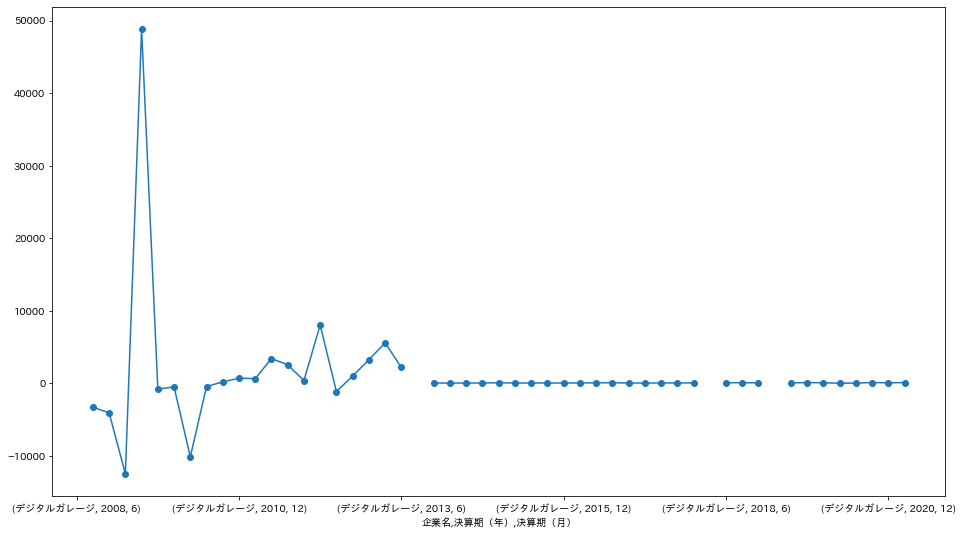

In [59]:
df_2008.loc[pd.IndexSlice[max_firm, :, :], :]["１株当たり利益［３ヵ月］"].plot(figsize=(16, 9), marker='o')

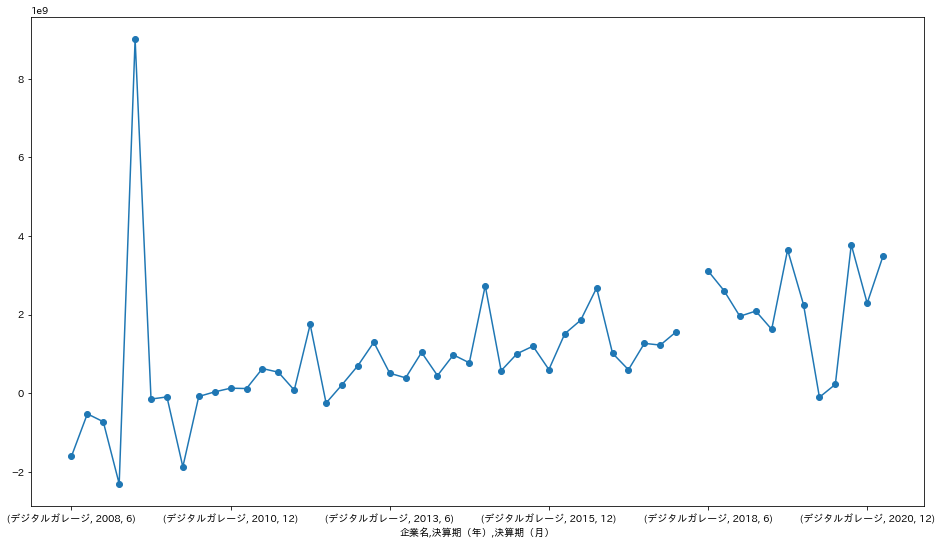

In [60]:
df_2008.loc[pd.IndexSlice[max_firm, :, :], :]['【ＱＴＲ】当期利益'].plot(figsize=(16, 9), marker='o')

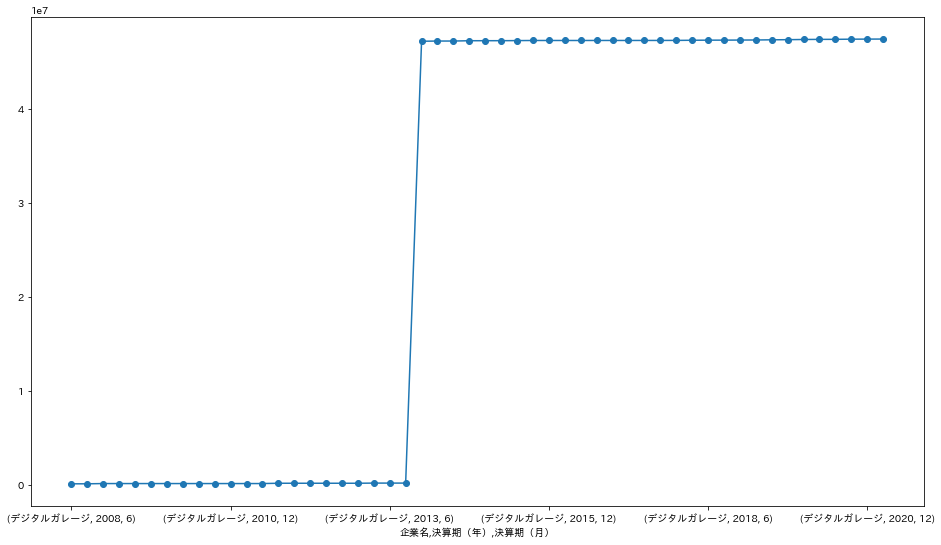

In [61]:
df_2008.loc[pd.IndexSlice[max_firm, :, :], :]["期末発行済株式総数"].plot(figsize=(16, 9), marker='o')

大外ししているようなデータを学習につかったり、予測の対象にするのは良くなさそう? それともそもそも1株当たりの値であるEPSを扱うのが良くない?

## データの観察 (scatter, heatmap)

In [62]:
# firm name list
firm_name_list = list(df_2008.index.get_level_values("企業名").unique().values)

random.seed(0)
firm_randsample = random.sample(firm_name_list, 10)

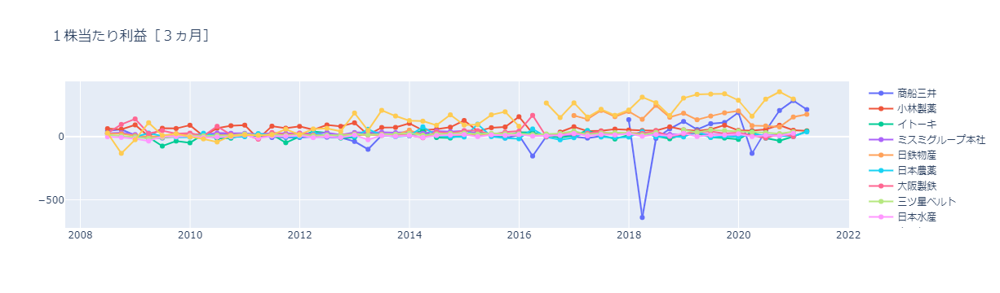

In [63]:
# plot EPS
fig = go.Figure()
for f in firm_randsample:
    fig.add_trace(go.Scatter(
        name=f,
        mode="markers+lines",
        x=df_2008.loc[f]["事業年度終了年月日"], #["決算期"], 
        y=df_2008.loc[f]["１株当たり利益［３ヵ月］"]
    ))

fig.update_layout(title_text="１株当たり利益［３ヵ月］")

fig.show()

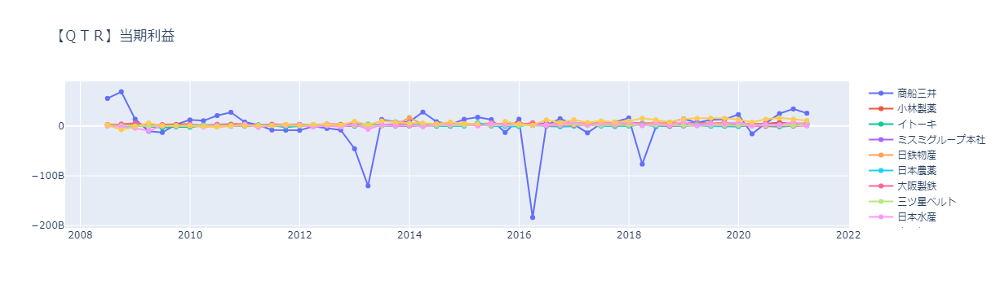

In [64]:
# plot time series plotly graphical object
# https://plotly.com/python/time-series/
# https://www.kaggle.com/thebrownviking20/everything-you-can-do-with-a-time-series
# 茶々っと形だけ見たいときはmatplotlib, データセットそのものの数値も知りたいときはplotly

# plot Net Income
fig = go.Figure()

for f in firm_randsample:
    fig.add_trace(go.Scatter(
        name=f,
        mode="markers+lines",
        x=df_2008.loc[f]["事業年度終了年月日"], #["決算期"], 
        y=df_2008.loc[f]['【ＱＴＲ】当期利益']
    ))

fig.update_layout(title_text='【ＱＴＲ】当期利益')

fig.show()

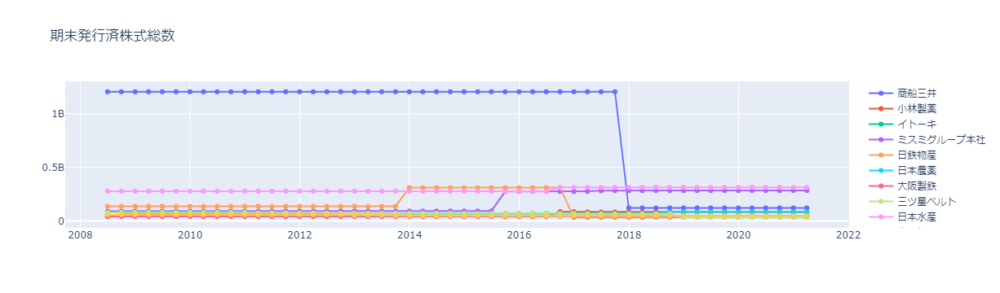

In [65]:
# plot num stock released
fig = go.Figure()
for f in firm_randsample:
    fig.add_trace(go.Scatter(
        name=f,
        mode="markers+lines",
        x=df_2008.loc[f]["事業年度終了年月日"], #["決算期"], 
        y=df_2008.loc[f]["期末発行済株式総数"]
    ))

fig.update_layout(title_text="期末発行済株式総数")

fig.show()